In [1]:
import matplotlib.pyplot as plt

from skimage.color import rgb2gray, rgba2rgb
import skimage.io as skio
from skimage.util.shape import view_as_windows
from skimage.transform import resize

import numpy as np
import pandas as pd 
from scipy import stats  
from einops import rearrange, reduce, repeat

import itertools
import os
import sys
import glob
import warnings
import tqdm

from utils import default_paths, nsd_utils

import copy


In [26]:
cr  = np.load('/user_data/mmhender/features/sketch_tokens/feature_curvrect_stats.npy', allow_pickle=True).item()

cr.keys()

dict_keys(['curv_rect_index', 'mean_curv', 'mean_rect', 'mean_lin', 'mean_curv_z', 'mean_rect_z', 'mean_lin_z', 'curv_score_overall', 'rect_score_overall', 'lin_score_overall'])

In [30]:
np.mean(cr['curv_rect_index'][:,0,0])

-0.33061690689183604

In [33]:
for kk in cr.keys():
    print(kk)
    print(np.mean(cr[kk][:,0,1]))

curv_rect_index
-0.2991440102241706
mean_curv
21.401473268272287
mean_rect
21.74207740822165
mean_lin
20.38791296597375
mean_curv_z
4.163336342344337e-17
mean_rect_z
-1.4340380734741606e-16
mean_lin_z
-1.3877787807814457e-16
curv_score_overall
4.103290764264213
rect_score_overall
117.1846436793528
lin_score_overall
2.042807032566291


In [20]:
# image_size = 21;
image_size = 128;
# scale_values = np.linspace(2,8,4)
freq_values_cyc_per_image = [64, 32, 16, 8, 4, 2]
freq_values_cyc_per_pix = np.array([64, 32, 16, 8, 4])/image_size
bend_values = [0, 0.125, 0.250, 0.375, 0.50]
# bend_values= [0, 0.04, 0.08, 0.16, 0.25, 0.32, 0.64]
from analyze_features import analyze_im_curvature
bank = analyze_im_curvature.bent_gabor_feature_bank(freq_values = freq_values, bend_values=bend_values, image_size=image_size)

freq values
[64, 32, 16, 8, 4, 2]
scale values
[ 2.  4.  6.  8. 10. 12.]
bend values
[0, 0.125, 0.25, 0.375, 0.5]
orient values
[0.         0.78539816 1.57079633 2.35619449 3.14159265 3.92699082
 4.71238898 5.49778714]


In [25]:
np.linspace(0,np.pi*2, 9)[0:8]

array([0.        , 0.78539816, 1.57079633, 2.35619449, 3.14159265,
       3.92699082, 4.71238898, 5.49778714])

In [24]:
freq_values_cyc_per_pix

array([0.5    , 0.25   , 0.125  , 0.0625 , 0.03125])

In [21]:
image_size = 21
freq_values_cyc_per_image = freq_values_cyc_per_pix*image_size
freq_values_cyc_per_image
bank = analyze_im_curvature.bent_gabor_feature_bank(freq_values = freq_values_cyc_per_image, \
                                                    bend_values=bend_values, \
                                                    image_size=image_size)\

freq values
[10.5      5.25     2.625    1.3125   0.65625]
scale values
[ 2.  4.  6.  8. 10.]
bend values
[0, 0.125, 0.25, 0.375, 0.5]
orient values
[0.         0.78539816 1.57079633 2.35619449 3.14159265 3.92699082
 4.71238898 5.49778714]


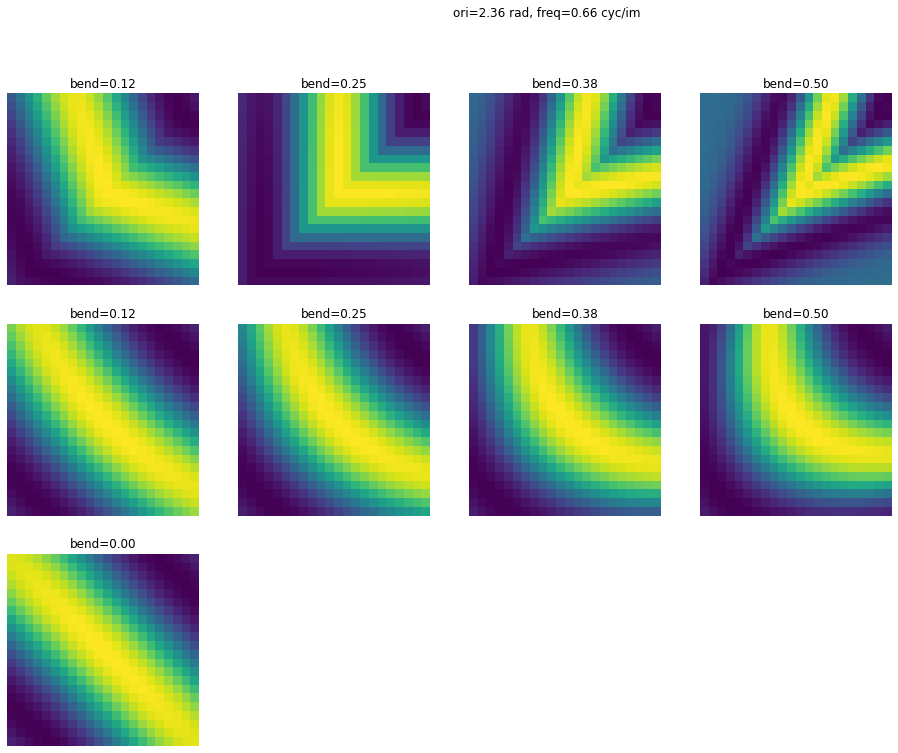

In [23]:
bank.plot_kernel_bends(scale_ind=4, ori_ind=3)

(0.0, 128.0, 0.0, 128.0)

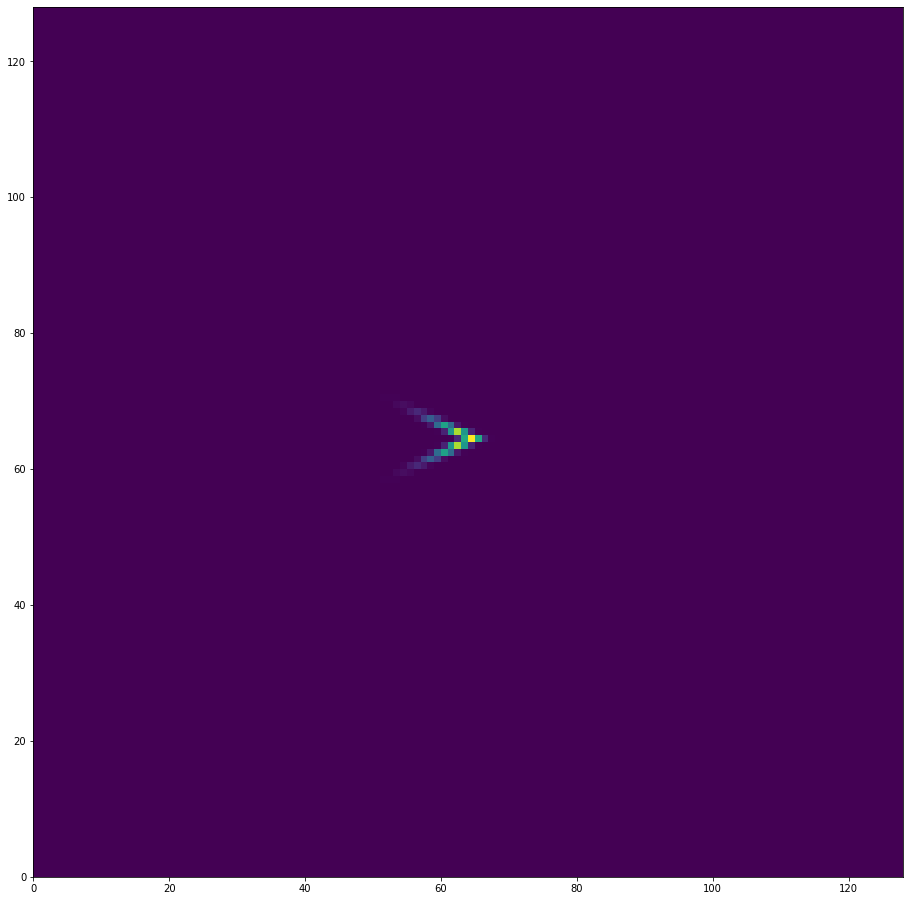

In [14]:
plt.figure(figsize=(16,16));
kernel_ind = np.where((bank.curv_kernel_pars[:,0]==bank.kA[0]) &\
                     (bank.curv_kernel_pars[:,1]==0.50) & \
                     (bank.curv_kernel_pars[:,2]==bank.orient_values[0]))[0][0]
plt.pcolormesh(np.abs(bank.kernels['rect_space'][kernel_ind]))
plt.axis('square')

In [13]:
kernel_ind

(array([24]),)

In [2]:
fn2load = '/user_data/mmhender/features/sketch_tokens/test_random_cocoims_curv_rect_values.npy'

In [61]:
fn2load = '/user_data/mmhender/features/sketch_tokens/test_random_cocoims_curv_rect_values_wlocalnorm.npy'

In [3]:
cr = np.load(fn2load, allow_pickle=True).item()

In [4]:
cr.keys()

dict_keys(['file_list', 'image_inds', 'curv_score_overall', 'rect_score_overall', 'curv_score_each_bend', 'rect_score_each_bend', 'curv_score_each_scale', 'rect_score_each_scale', 'lin_score_overall', 'mean_curv_over_space', 'mean_rect_over_space', 'mean_lin_over_space', 'curv_kernel_pars', 'rect_kernel_pars', 'lin_kernel_pars'])

In [5]:
cr['mean_curv_over_space'].shape

(1000, 160)

In [6]:
image_inds = cr['image_inds']

images = nsd_utils.get_image_data(subject=1)
images = images[image_inds,:,:,:]
image_size = images.shape[2:4]
images = nsd_utils.image_uncolorize_fn(images)



Loading images for subject 1

image data size: (10000, 3, 240, 240) , dtype: uint8 , value range: 0 255


In [7]:
cr['curv_score_each_bend'].shape

(1000, 5)

In [34]:
folder2save = os.path.join(default_paths.sketch_token_feat_path, 'top_im_patches')
mm = 0
imfn = os.path.join(folder2save, 'S1_prf%d_feature0_ranked0.jpg'%mm)
from PIL import Image
im = Image.open(imfn)

In [37]:
skio.imread(imfn).shape

(21, 21)

In [24]:
bank.freq_cyc_per_kernel


array([64., 32., 16.,  8.])

In [27]:
kA = bank.freq_cyc_per_kernel*2*np.pi / bank.kernel_size
scales = np.log(2*np.pi/kA)/np.log(np.sqrt(2))
scales

array([2., 4., 6., 8.])

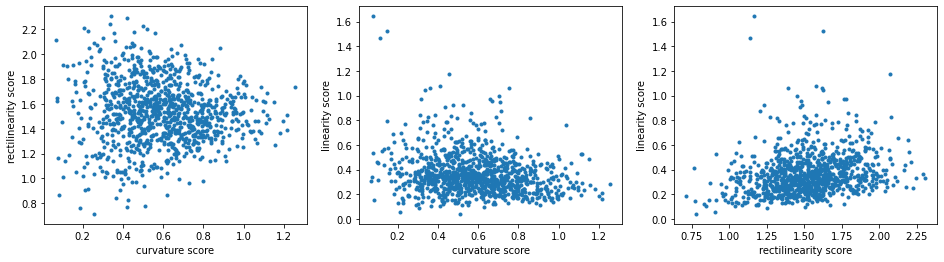

In [9]:
plt.figure(figsize=(16,4));
plt.subplot(1,3,1);
plt.plot(cr['curv_score_overall'], cr['rect_score_overall'],'.')
plt.xlabel('curvature score');
plt.ylabel('rectilinearity score');
plt.subplot(1,3,2);
plt.plot(cr['curv_score_overall'], cr['lin_score_overall'],'.')
plt.xlabel('curvature score');
plt.ylabel('linearity score');
plt.subplot(1,3,3);
plt.plot(cr['rect_score_overall'], cr['lin_score_overall'],'.')
plt.xlabel('rectilinearity score');
plt.ylabel('linearity score');

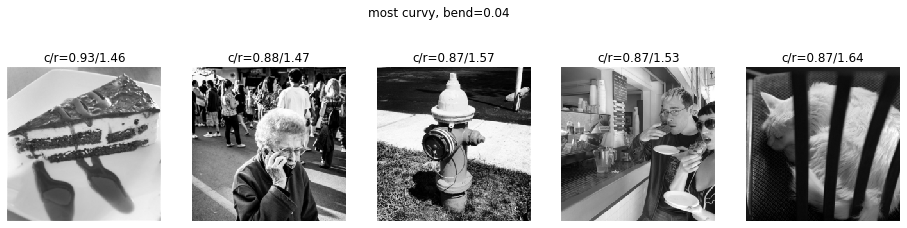

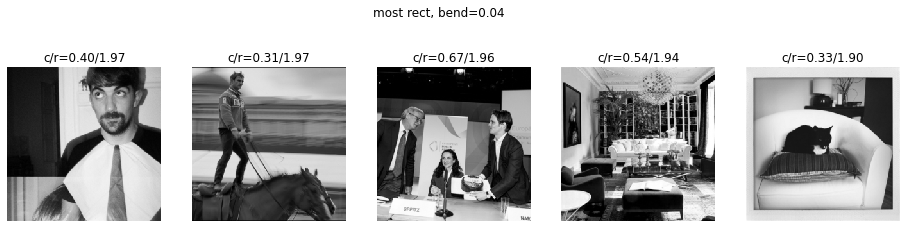

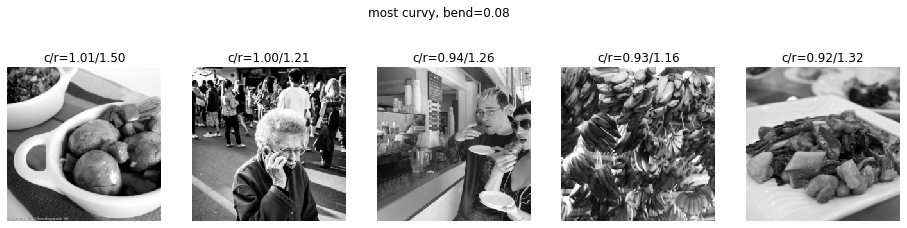

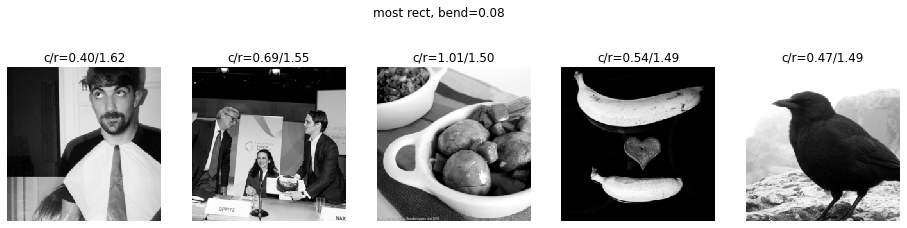

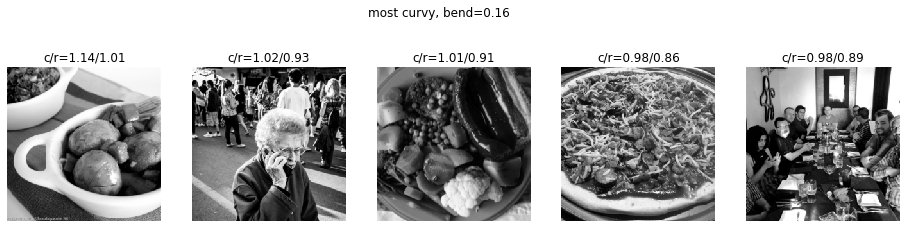

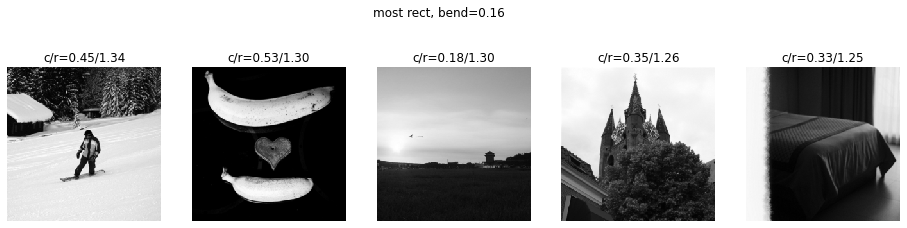

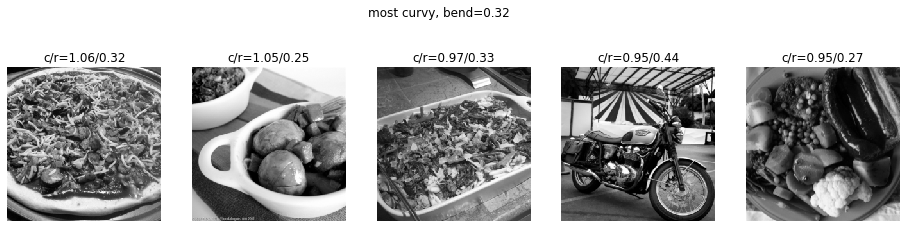

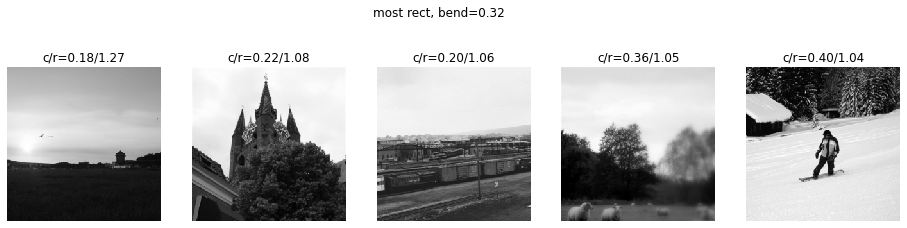

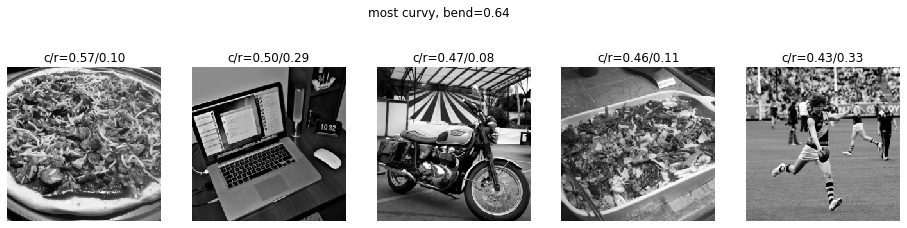

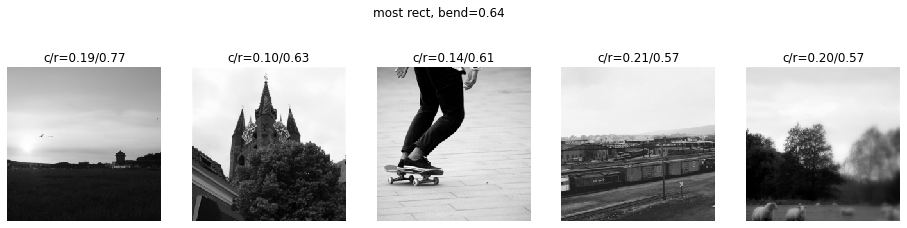

In [10]:
# Plot images sorted by their curviness


for bb in range(len(bank.bend_values)-1):

    score = cr['curv_score_each_bend'][:,bb]
#     score = (cr['curv_score_each_bend'][:,bb] - cr['rect_score_each_bend'][:,bb])/ \
#                 (cr['curv_score_each_bend'][:,bb] + cr['rect_score_each_bend'][:,bb])
    sort_order = np.flip(np.argsort(score))[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(cr['curv_score_each_bend'][ii,bb], \
                                          cr['rect_score_each_bend'][ii,bb]))
    plt.suptitle('most curvy, bend=%.2f'%bank.bend_values[bb+1])

    score = cr['rect_score_each_bend'][:,bb]
    sort_order = np.flip(np.argsort(score))[0:5]
#     sort_order = np.argsort(score)[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(cr['curv_score_each_bend'][ii,bb], \
                                          cr['rect_score_each_bend'][ii,bb]))

    plt.suptitle('most rect, bend=%.2f'%bank.bend_values[bb+1])

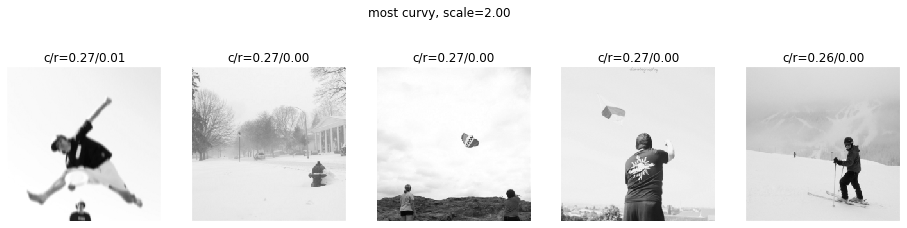

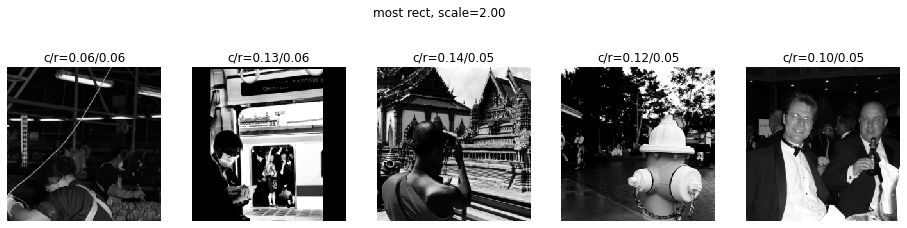

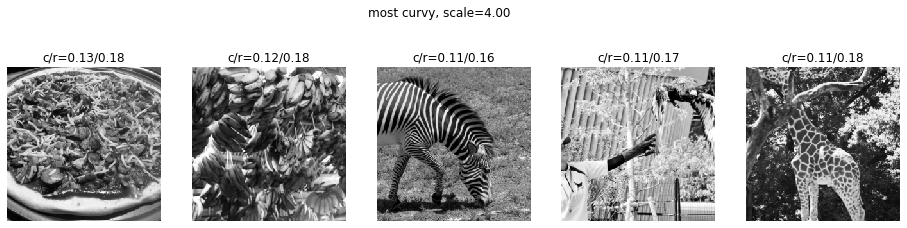

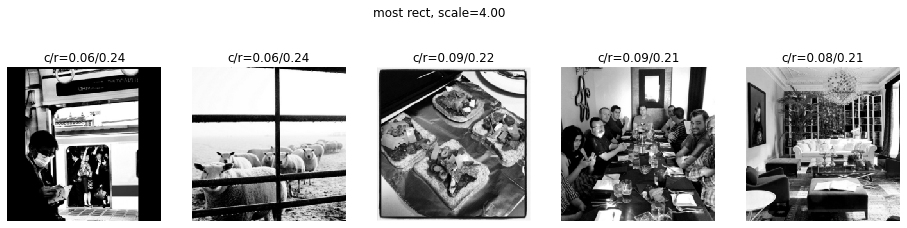

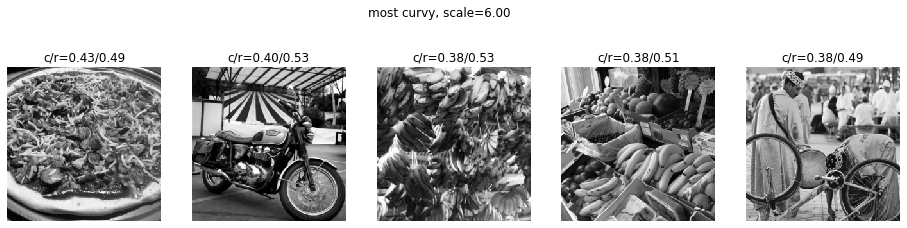

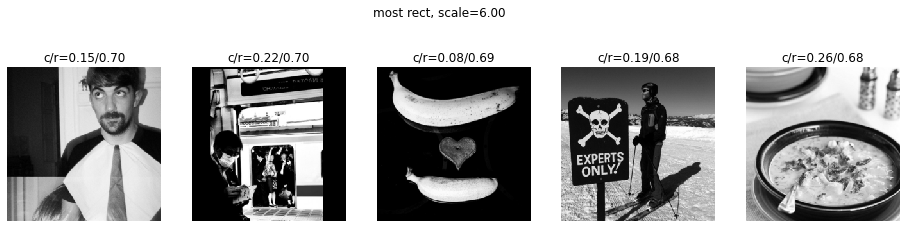

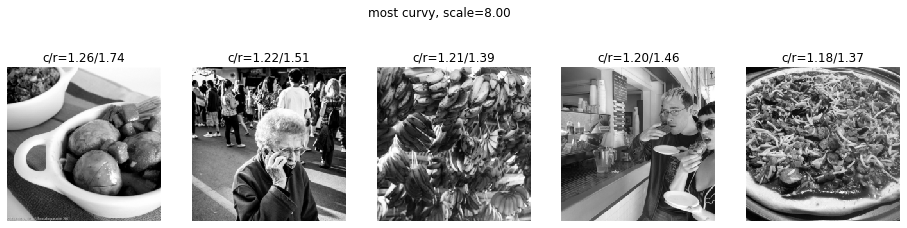

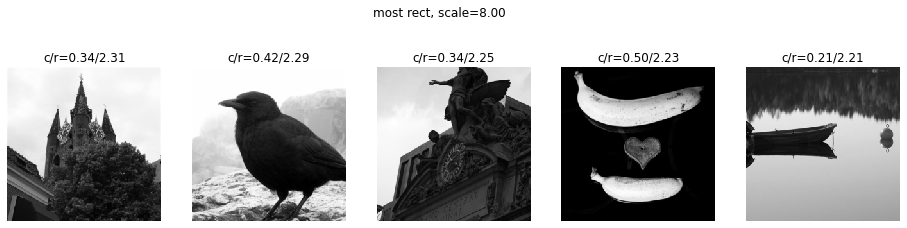

In [11]:
# Plot images sorted by their curviness

for sc in range(len(bank.scale_values)):

    score = cr['curv_score_each_scale'][:,sc]
#     score = (cr['curv_score_each_scale'][:,sc] - cr['rect_score_each_scale'][:,sc]) / \
#             (cr['curv_score_each_scale'][:,sc] + cr['rect_score_each_scale'][:,sc])
    sort_order = np.flip(np.argsort(score))[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(cr['curv_score_each_scale'][ii,sc], \
                                          cr['rect_score_each_scale'][ii,sc]))
    plt.suptitle('most curvy, scale=%.2f'%bank.scale_values[sc])

    score = cr['rect_score_each_scale'][:,sc]
    sort_order = np.flip(np.argsort(score))[0:5]

#     sort_order = np.argsort(score)[0:5]

    plt.figure(figsize=(16,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')
        plt.title('c/r=%.2f/%.2f'%(cr['curv_score_each_scale'][ii,sc], \
                                          cr['rect_score_each_scale'][ii,sc]))

    plt.suptitle('most rect, scale=%.2f'%bank.scale_values[sc])

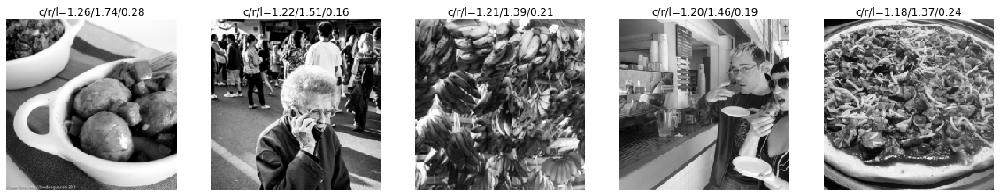

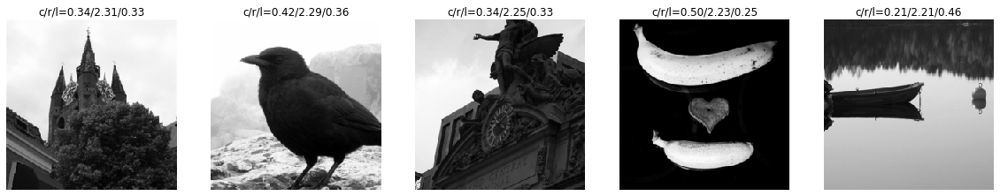

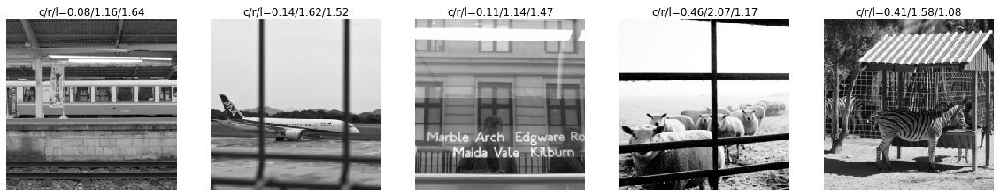

In [12]:
# Plot images sorted by their curviness

sort_order = np.flip(np.argsort(cr['curv_score_overall']))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(cr['curv_score_overall'][ii], \
                                      cr['rect_score_overall'][ii], \
                                      cr['lin_score_overall'][ii]))

    
sort_order = np.flip(np.argsort(cr['rect_score_overall']))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(cr['curv_score_overall'][ii], \
                                      cr['rect_score_overall'][ii], \
                                      cr['lin_score_overall'][ii]))

sort_order = np.flip(np.argsort(cr['lin_score_overall']))[0:5]

plt.figure(figsize=(20,20));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.title('c/r/l=%.2f/%.2f/%.2f'%(cr['curv_score_overall'][ii], \
                                      cr['rect_score_overall'][ii], \
                                      cr['lin_score_overall'][ii]))


Text(0.5, 0.98, 'top rect')

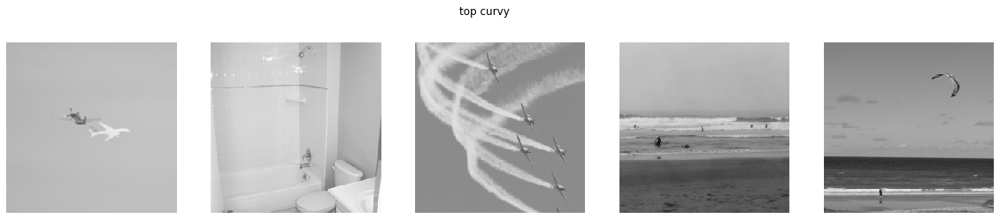

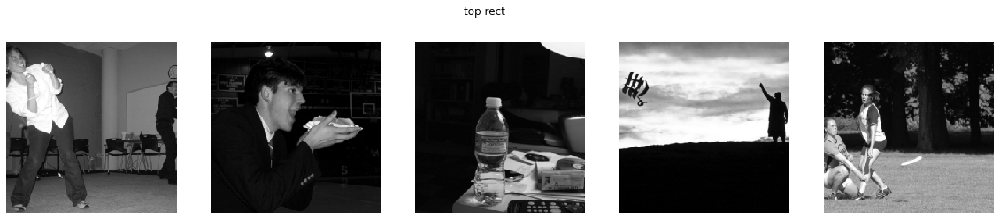

In [72]:
# Plot images sorted by their curviness

curv = np.mean(cr['mean_curv_over_space'], axis=1)
rect = np.mean(cr['mean_rect_over_space'], axis=1)
lin = np.mean(cr['mean_lin_over_space'], axis=1)

curv_rect_index = (curv-rect-lin)/(curv+rect+lin)
# curv_rect_index = (curv-lin)/(curv+lin)
# curv_rect_index = curv

sort_order = np.flip(np.argsort(curv_rect_index))[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top curvy')
    
sort_order = np.argsort(curv_rect_index)[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top rect')


Text(0.5, 0.98, 'top rect')

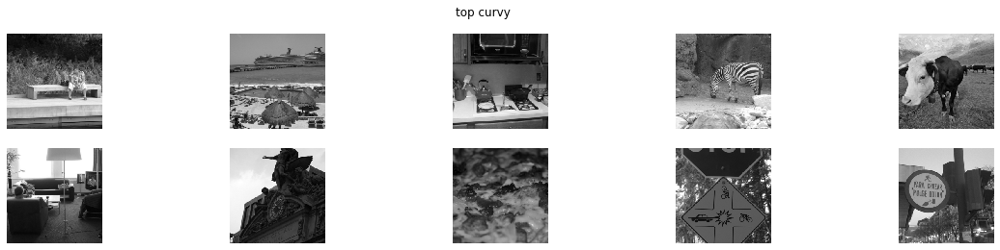

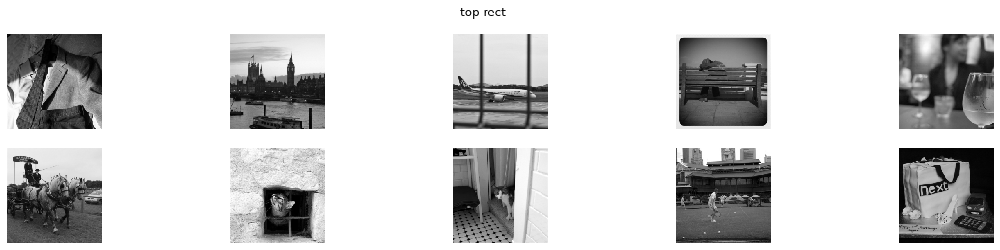

In [16]:
# Plot images sorted by their curviness
import scipy.stats

curv = np.mean(scipy.stats.zscore(cr['mean_curv_over_space'], axis=0), axis=1)
rect = np.mean(scipy.stats.zscore(cr['mean_rect_over_space'], axis=0), axis=1)
lin = np.mean(scipy.stats.zscore(cr['mean_lin_over_space'], axis=0), axis=1)
# curv = np.mean(cr['mean_curv_over_space'], axis=1)
# rect = np.mean(cr['mean_rect_over_space'], axis=1)
# lin = np.mean(cr['mean_lin_over_space'], axis=1)

# curv_rect_index = (curv-rect)/(curv+rect)
curv_rect_index = (curv-rect-lin)/(curv+rect+lin)
# curv_rect_index = (curv-lin)/(curv+lin)
# curv_rect_index = curv

# sort_order = np.flip(np.argsort(curv))[0:5]
sort_order = np.flip(np.argsort(curv_rect_index))[0:10]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(2,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top curvy')
    
# sort_order = np.flip(np.argsort(rect))[0:5]
sort_order = np.argsort(curv_rect_index)[0:10]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(2,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top rect')


Text(0.5, 0.98, 'top rect')

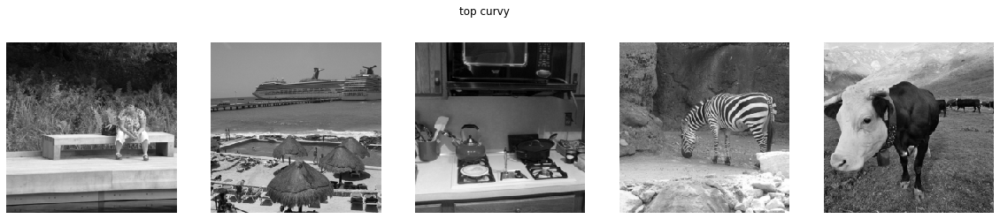

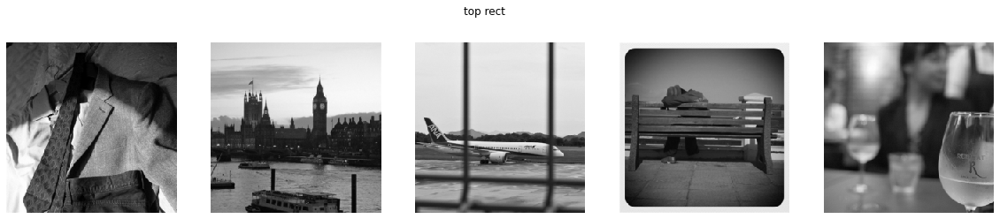

In [13]:
# Plot images sorted by their curviness
import scipy.stats

curv = np.mean(scipy.stats.zscore(cr['mean_curv_over_space'], axis=0), axis=1)
rect = np.mean(scipy.stats.zscore(cr['mean_rect_over_space'], axis=0), axis=1)
lin = np.mean(scipy.stats.zscore(cr['mean_lin_over_space'], axis=0), axis=1)
# curv = np.mean(cr['mean_curv_over_space'], axis=1)
# rect = np.mean(cr['mean_rect_over_space'], axis=1)
# lin = np.mean(cr['mean_lin_over_space'], axis=1)

# curv_rect_index = (curv-rect)/(curv+rect)
curv_rect_index = (curv-rect-lin)/(curv+rect+lin)
# curv_rect_index = (curv-lin)/(curv+lin)
# curv_rect_index = curv

# sort_order = np.flip(np.argsort(curv))[0:5]
sort_order = np.flip(np.argsort(curv_rect_index))[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top curvy')
    
# sort_order = np.flip(np.argsort(rect))[0:5]
sort_order = np.argsort(curv_rect_index)[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top rect')


Text(0.5, 0.98, 'top rect')

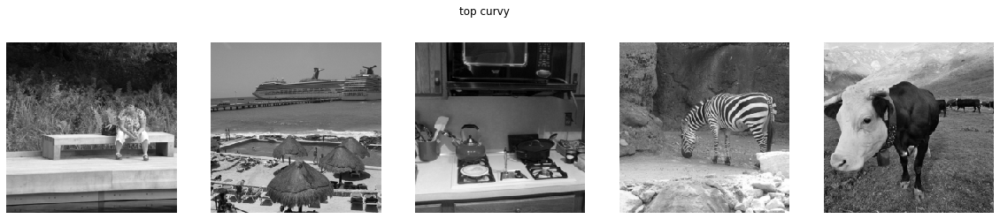

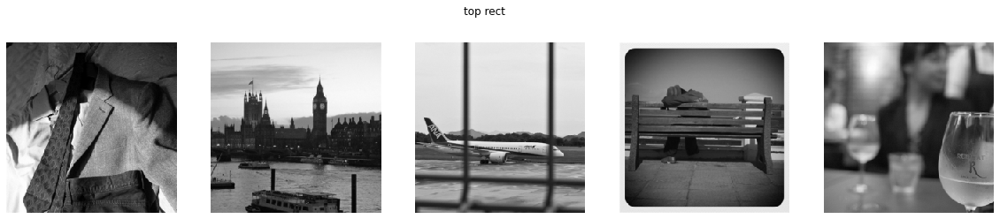

In [60]:
# Plot images sorted by their curviness
import scipy.stats

curv = np.mean(scipy.stats.zscore(cr['mean_curv_over_space'], axis=0), axis=1)
rect = np.mean(scipy.stats.zscore(cr['mean_rect_over_space'], axis=0), axis=1)
lin = np.mean(scipy.stats.zscore(cr['mean_lin_over_space'], axis=0), axis=1)
# curv = np.mean(cr['mean_curv_over_space'], axis=1)
# rect = np.mean(cr['mean_rect_over_space'], axis=1)
# lin = np.mean(cr['mean_lin_over_space'], axis=1)

curv_rect_index = (curv-rect-lin)/(curv+rect+lin)
# curv_rect_index = (curv-lin)/(curv+lin)
# curv_rect_index = curv

# sort_order = np.flip(np.argsort(curv))[0:5]
sort_order = np.flip(np.argsort(curv_rect_index))[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top curvy')
    
# sort_order = np.flip(np.argsort(rect))[0:5]
sort_order = np.argsort(curv_rect_index)[0:5]

plt.figure(figsize=(20,4));
for pi, ii in enumerate(sort_order):
    
    image_gray = images[ii,0,:,:]

    plt.subplot(1,5,pi+1)
    plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
    plt.axis('square')
    plt.gca().invert_yaxis()
    plt.axis('off')

plt.suptitle('top rect')


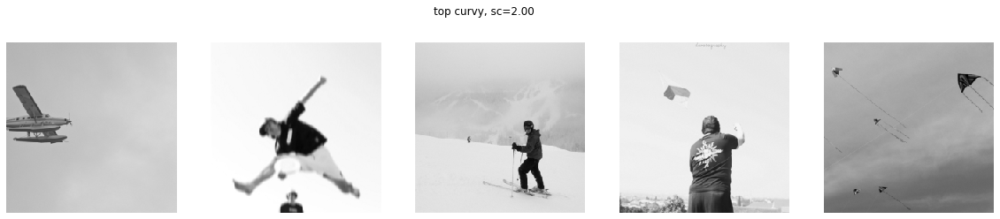

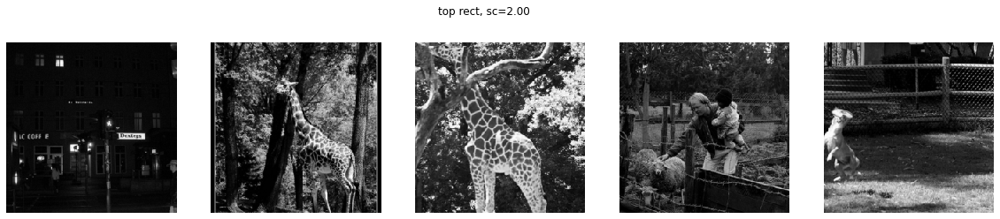

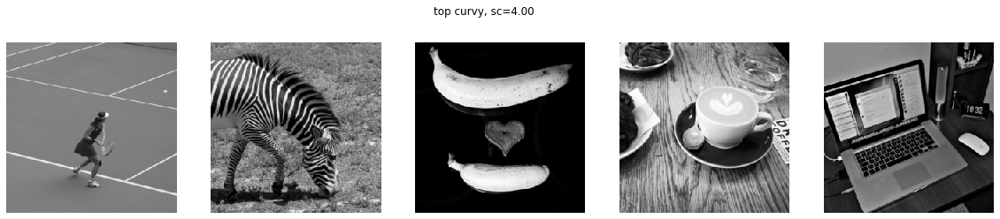

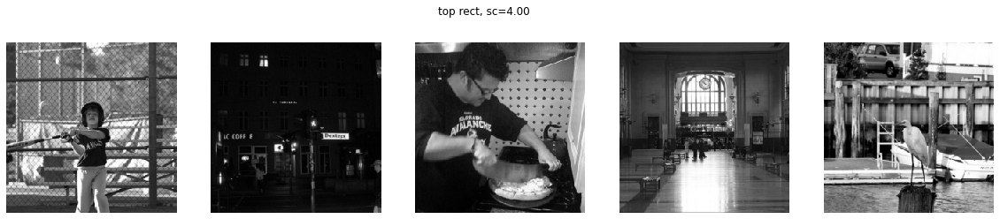

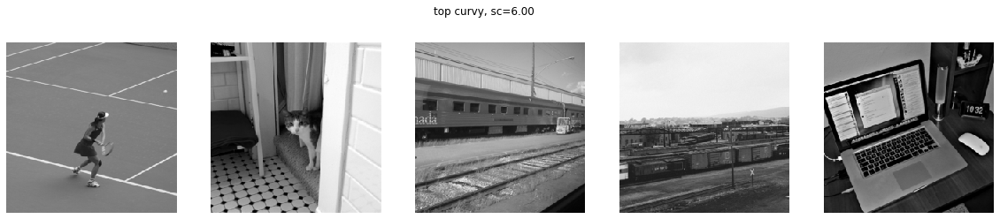

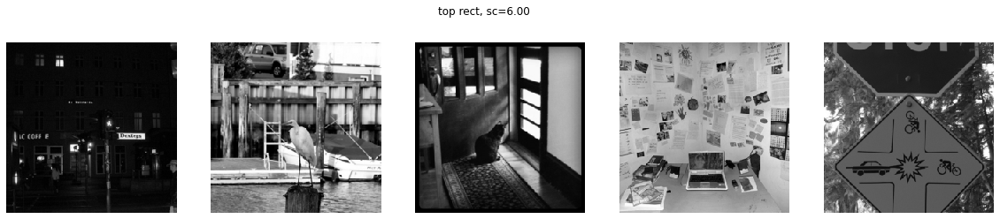

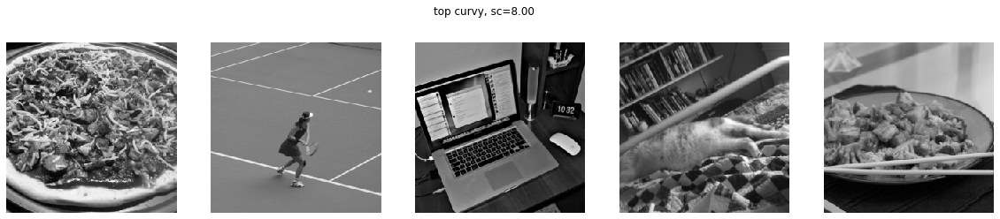

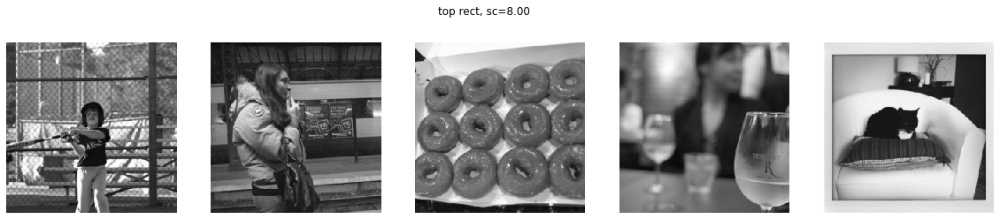

In [40]:
# Plot images sorted by their curviness

for sc in range(len(bank.scale_values)):
    
    kernel_inds = cr['curv_kernel_pars'][:,0]==bank.kA[sc]
    curv = np.mean(cr['mean_curv_over_space'][:,kernel_inds], axis=1)
    rect = np.mean(cr['mean_rect_over_space'][:,kernel_inds], axis=1)
    
    lin_kernel_inds = cr['lin_kernel_pars'][:,0]==bank.kA[sc]
    lin = np.mean(cr['mean_lin_over_space'][:,lin_kernel_inds], axis=1)

#     curv_rect_index = (curv-lin)/(curv+lin)
    curv_rect_index = (curv-rect-lin)/(curv+rect+lin)
#     curv_rect_index = (curv-rect)/(curv+rect)
#     curv_rect_index = curv

    sort_order = np.flip(np.argsort(curv_rect_index))[0:5]

    plt.figure(figsize=(20,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')

    plt.suptitle('top curvy, sc=%.2f'%bank.scale_values[sc])

    sort_order = np.argsort(curv_rect_index)[0:5]

    plt.figure(figsize=(20,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')

    plt.suptitle('top rect, sc=%.2f'%bank.scale_values[sc])


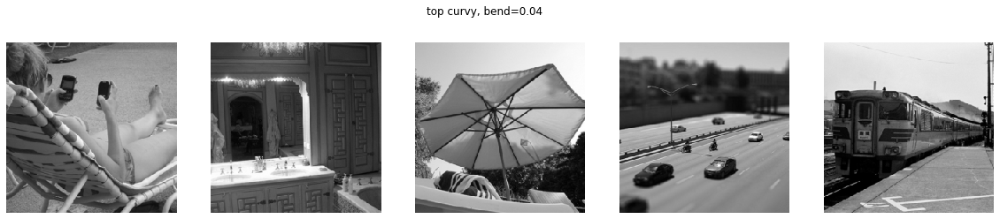

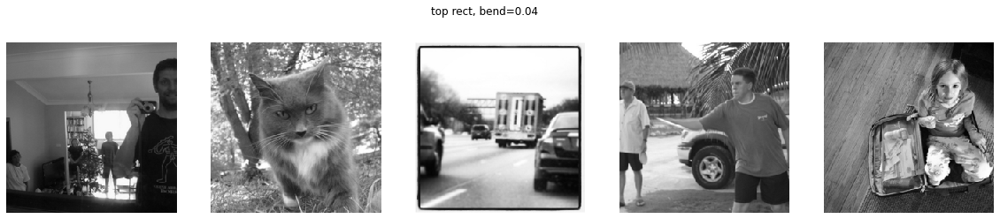

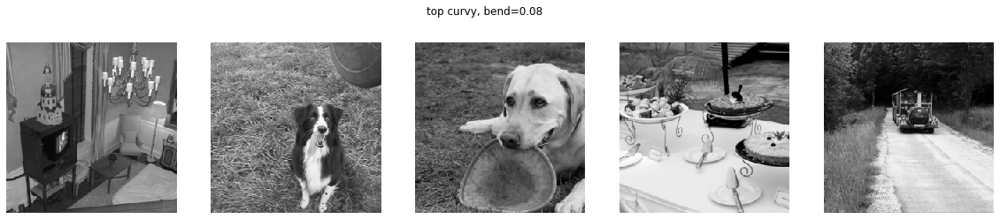

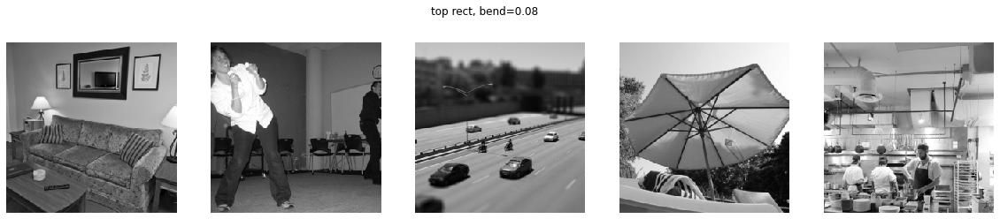

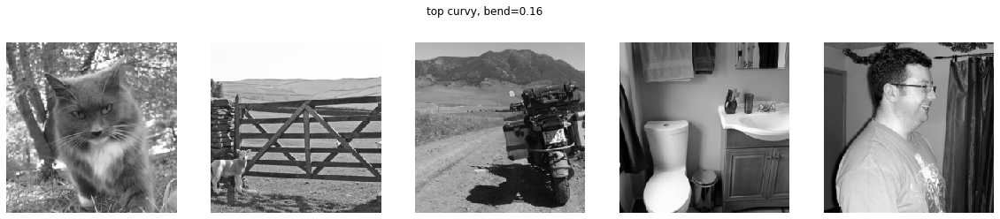

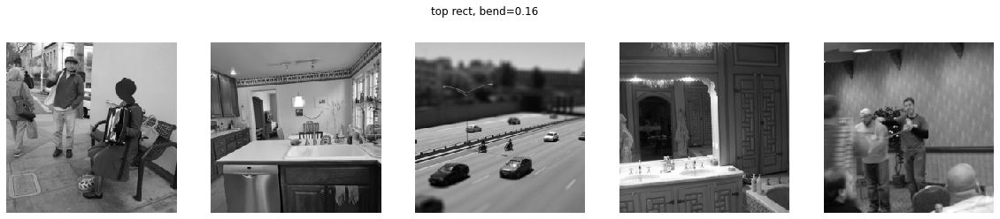

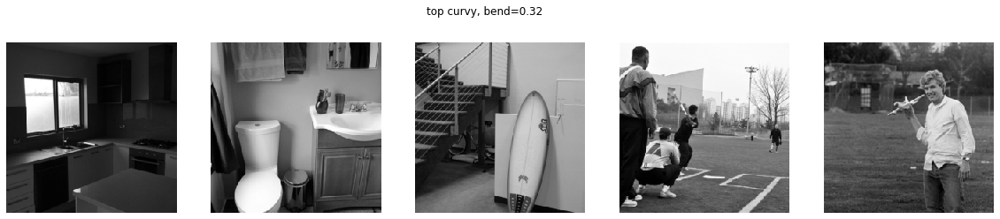

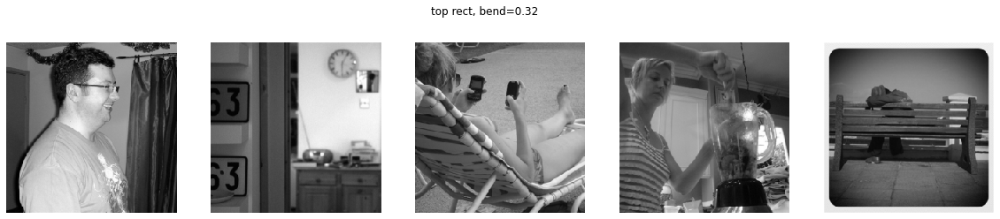

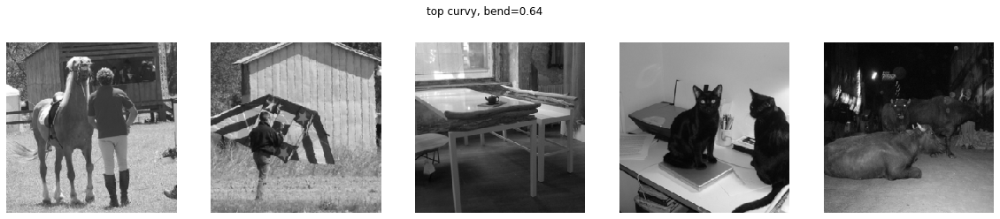

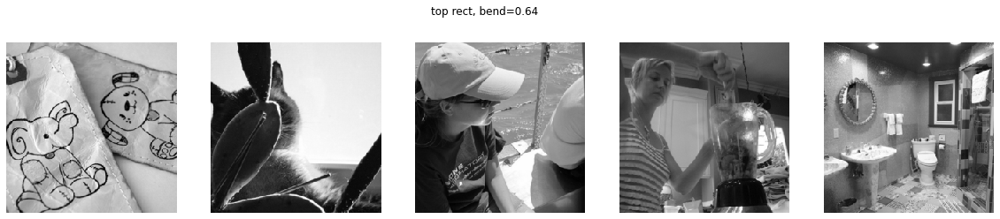

In [82]:
# Plot images sorted by their curviness


for bb in range(len(bank.bend_values)-1):
    
#     kernel_inds = cr['curv_kernel_pars'][:,1]==bank.bend_values[bb+1]
#     curv = np.mean(cr['mean_curv_over_space'][:,kernel_inds], axis=1)
#     rect = np.mean(cr['mean_rect_over_space'][:,kernel_inds], axis=1)
    
#     lin_kernel_inds = cr['lin_kernel_pars'][:,1]==bank.bend_values[0]
#     lin = np.mean(cr['mean_lin_over_space'][:,lin_kernel_inds], axis=1)
    
    kernel_inds = cr['curv_kernel_pars'][:,1]==bank.bend_values[bb+1]
    curv = np.mean(scipy.stats.zscore(cr['mean_curv_over_space'][:,kernel_inds], axis=0), axis=1)
    rect = np.mean(scipy.stats.zscore(cr['mean_rect_over_space'][:,kernel_inds], axis=0), axis=1)
    
    lin_kernel_inds = cr['lin_kernel_pars'][:,1]==bank.bend_values[0]
    lin = np.mean(scipy.stats.zscore(cr['mean_lin_over_space'][:,lin_kernel_inds], axis=0), axis=1)

    curv_rect_index = (curv-rect)/(curv+rect)
#     curv_rect_index = (curv-rect-lin)/(curv+rect+lin)

    sort_order = np.flip(np.argsort(curv_rect_index))[0:5]

    plt.figure(figsize=(20,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')

    plt.suptitle('top curvy, bend=%.2f'%bank.bend_values[bb+1])

    sort_order = np.argsort(curv_rect_index)[0:5]

    plt.figure(figsize=(20,4));
    for pi, ii in enumerate(sort_order):

        image_gray = images[ii,0,:,:]

        plt.subplot(1,5,pi+1)
        plt.pcolormesh(image_gray,cmap='gray',vmin=0, vmax=1)
        plt.axis('square')
        plt.gca().invert_yaxis()
        plt.axis('off')

    plt.suptitle('top rect, bend=%.2f'%bank.bend_values[bb+1])
